<a href="https://colab.research.google.com/github/KeisukeShimokawa/papers-challenge/blob/master/src/vae/vae/notebooks/vae.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

from [pytorch/examples](https://github.com/pytorch/examples/blob/master/vae/main.py)

In [1]:
!nvidia-smi | head -n 10

Sun May 17 02:22:54 2020       
+-----------------------------------------------------------------------------+
| NVIDIA-SMI 440.82       Driver Version: 418.67       CUDA Version: 10.1     |
|-------------------------------+----------------------+----------------------+
| GPU  Name        Persistence-M| Bus-Id        Disp.A | Volatile Uncorr. ECC |
| Fan  Temp  Perf  Pwr:Usage/Cap|         Memory-Usage | GPU-Util  Compute M. |
|===============================+======================+======================|
|   0  Tesla P100-PCIE...  Off  | 00000000:00:04.0 Off |                    0 |
| N/A   39C    P0    27W / 250W |      0MiB / 16280MiB |      0%      Default |
+-------------------------------+----------------------+----------------------+


In [0]:
%load_ext tensorboard

In [0]:
import os
import re
import glob
import random
import dataclasses
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.animation as animation
from IPython.display import HTML
from PIL import Image

import torch
from torch import nn, optim
from torch.nn import functional as F
from torch.utils.data import DataLoader
from torch.utils.tensorboard import SummaryWriter
from torchvision import datasets, transforms
from torchvision.utils import save_image, make_grid
from torchsummary import summary

In [4]:
!pip freeze | grep torch

torch==1.5.0+cu101
torchsummary==1.5.1
torchtext==0.3.1
torchvision==0.6.0+cu101


In [0]:
@dataclasses.dataclass(frozen=True)
class Config:
    # setting
    is_cuda: bool     = True
    seed: int         = 42
    # training
    lr: int           = 1e-3
    batch_size: int   = 256
    n_epochs: int     = 50
    log_interval: int = 50
    # dataset
    num_workers: int  = 4
    pin_memory: bool  = True
    # model
    nin: int          = 784
    nh: int           = 400
    nz: int           = 20

In [6]:
cfg = Config()
print(cfg)

Config(is_cuda=True, seed=42, lr=0.001, batch_size=256, n_epochs=50, log_interval=50, num_workers=4, pin_memory=True, nin=784, nh=400, nz=20)


In [0]:
def set_seed(seed):
    random.seed(seed)
    np.random.seed(seed)
    os.environ["PYTHONHASHSEED"] = str(seed)
    torch.manual_seed(seed)
    torch.cuda.manual_seed(seed)
    torch.backends.cudnn.deterministic = True

In [8]:
if cfg.is_cuda:
    print(f"set seed: {cfg.seed}")
    set_seed(cfg.seed)

set seed: 42


In [9]:
is_cuda = cfg.is_cuda and torch.cuda.is_available()
device = torch.device("cuda:0" if is_cuda else "cpu")
print(device)

cuda:0


In [0]:
def get_loader(cfg, mode, transform):
    assert mode in ["train", "test"], "set moode in ['train', 'test']"

    if mode == "train":
        loader = DataLoader(
            datasets.FashionMNIST("./data", train=True, download=True, transform=transform),
            batch_size=cfg.batch_size,
            shuffle=True,
            num_workers=cfg.num_workers,
            pin_memory=cfg.pin_memory
        )
    elif mode == "test":
        loader = DataLoader(
            datasets.FashionMNIST("./data", train=False, download=True, transform=transform),
            batch_size=cfg.batch_size,
            shuffle=False,
            num_workers=cfg.num_workers,
            pin_memory=cfg.pin_memory
        )

    return loader

In [0]:
train_transforms = transforms.Compose([
    transforms.ToTensor(),
    # transforms.Normalize((0.5,), (0.5,))
])

test_transforms = transforms.Compose([
    transforms.ToTensor(),
    # transforms.Normalize((0.5,), (0.5,))
])

In [12]:
train_loader = get_loader(cfg, "train", train_transforms)
test_loader  = get_loader(cfg, "test",  test_transforms)

Extracting ./data/FashionMNIST/raw/train-images-idx3-ubyte.gz to ./data/FashionMNIST/raw


Extracting ./data/FashionMNIST/raw/train-labels-idx1-ubyte.gz to ./data/FashionMNIST/raw



Extracting ./data/FashionMNIST/raw/t10k-images-idx3-ubyte.gz to ./data/FashionMNIST/raw


Extracting ./data/FashionMNIST/raw/t10k-labels-idx1-ubyte.gz to ./data/FashionMNIST/raw
Processing...
Done!


/pytorch/torch/csrc/utils/tensor_numpy.cpp:141: UserWarning: The given NumPy array is not writeable, and PyTorch does not support non-writeable tensors. This means you can write to the underlying (supposedly non-writeable) NumPy array using the tensor. You may want to copy the array to protect its data or make it writeable before converting it to a tensor. This type of warning will be suppressed for the rest of this program.


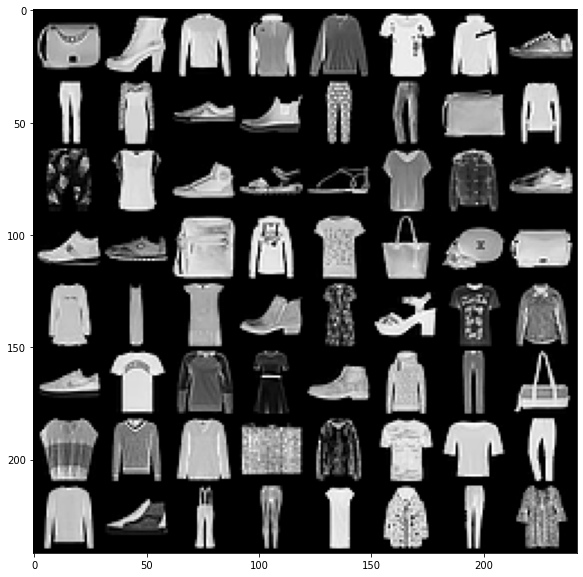

In [13]:
plt.figure(figsize=(10, 10))
plt.imshow(make_grid(next(iter(train_loader))[0][:64]).permute(1, 2, 0).numpy())

In [0]:
class VAE(nn.Module):
    def __init__(self, nin, nh, nz):
        super(VAE, self).__init__()

        self.fc1 = nn.Linear(nin, nh)
        self.fc_mu  = nn.Linear(nh, nz)
        self.fc_logvar = nn.Linear(nh, nz)
        self.fc2 = nn.Linear(nz, nh)
        self.fc3 = nn.Linear(nh, nin)

    def encode(self, x):
        # x: [batch_size, 784]
        h1 = F.relu(self.fc1(x))
        mu = self.fc_mu(h1)
        logvar = self.fc_logvar(h1)
        return mu, logvar

    def reparameterize(self, mu, logvar):
        std = torch.exp(0.5*logvar)
        eps = torch.randn_like(std)
        return mu + eps*std

    def decode(self, z):
        # z: [batch_size, nz]
        h2 = F.relu(self.fc2(z))
        recon = torch.sigmoid(self.fc3(h2))
        return recon

    def forward(self, x):
        # x:      [batch_size, 1, 28, 28]
        # return: [batch_size, 784]
        mu, logvar = self.encode(x.view(-1, 784))
        z = self.reparameterize(mu, logvar)
        recon = self.decode(z)
        return recon, mu, logvar

In [0]:
model = VAE(cfg.nin, cfg.nh, cfg.nz)
model = model.to(device)

In [16]:
summary(model, (1, 28, 28))

----------------------------------------------------------------
        Layer (type)               Output Shape         Param #
            Linear-1                  [-1, 400]         314,000
            Linear-2                   [-1, 20]           8,020
            Linear-3                   [-1, 20]           8,020
            Linear-4                  [-1, 400]           8,400
            Linear-5                  [-1, 784]         314,384
Total params: 652,824
Trainable params: 652,824
Non-trainable params: 0
----------------------------------------------------------------
Input size (MB): 0.00
Forward/backward pass size (MB): 0.01
Params size (MB): 2.49
Estimated Total Size (MB): 2.51
----------------------------------------------------------------


In [0]:
optimizer = optim.Adam(model.parameters(), lr=cfg.lr)

In [0]:
def criterion(recon_x, x, mu, logvar):
    BCE = F.binary_cross_entropy(recon_x, x.view(-1, 784), reduction="sum")

    # 0.5 * sum(1 + log(sigma^2) - mu^2 - sigma^2)
    KLD = -0.5*torch.sum(1 + logvar - mu.pow(2) - logvar.exp())

    return BCE + KLD

In [0]:
def train(loader, model, optimizer, epoch, log_interval):
    model.train()
    train_loss = 0.0
    for batch_idx, (data, _) in enumerate(loader):
        data = data.to(device)
        optimizer.zero_grad()
        recon_batch, mu, logvar = model(data)
        loss = criterion(recon_batch, data, mu, logvar)
        loss.backward()
        train_loss += loss.item()
        optimizer.step()

        if batch_idx % cfg.log_interval == 0:
            print("Train Epoch: {} [{}/{} ({:.0f}%)]\tLoss: {:.6f}".format(
                epoch, 
                batch_idx * len(data), 
                len(train_loader.dataset),
                100. * batch_idx / len(train_loader),
                loss.item() / len(data))
            )
            
    print("====> Epoch: {} Average loss: {:.4f}".format(
        epoch, train_loss / len(train_loader.dataset))
    )

In [0]:
def test(loader, model, epoch, writer):
    model.eval()
    test_loss = 0
    batch_size = loader.batch_size
    with torch.no_grad():
        for i, (data, _) in enumerate(loader):
            data = data.to(device)
            recon_batch, mu, logvar = model(data)
            test_loss += criterion(recon_batch, data, mu, logvar).item()
            if i == 0:
                n = min(data.size(0), 8)
                comparison = torch.cat([data[:n], recon_batch.view(batch_size, 1, 28, 28)[:n]])
                save_image(comparison.cpu(), "reconstruction_"+str(epoch)+".png", nrow=n)
                add_image_tensorboard(comparison.cpu(), epoch, writer, "recon")

    test_loss /= len(loader.dataset)
    print("====> Test set loss: {:.4f}".format(test_loss))

In [0]:
!rm -rf ./runs
!rm -rf *.png
!rm -rf *.mp4

In [22]:
%tensorboard --logdir ./runs

<IPython.core.display.Javascript object>

In [0]:
def add_image_tensorboard(tensor, epoch, writer, label):
    grid_tensor = make_grid(tensor, padding=1, normalize=True)
    # plt.imshow(np.transpose(grid_tensor.numpy(), (1, 2, 0)))
    # plt.axis("off")
    # fig = plt.gcf()
    # writer.add_figure(tag="temp", figure=fig, global_step=epoch, close=True)
    writer.add_image(label, grid_tensor, global_step=epoch)

In [24]:
writer = SummaryWriter()
sample_img_list = []
fixed_noise = torch.randn(cfg.batch_size, cfg.nz).to(device)

for epoch in range(1, cfg.n_epochs):
    train(train_loader, model, optimizer, epoch, cfg.log_interval)
    test(test_loader, model, epoch, writer)

    with torch.no_grad():
        sample = model.decode(fixed_noise).detach().cpu()
        n = min(sample.size(0), 16)
        sample = sample[:n]

        save_image(sample.view(-1, 1, 28, 28), "sample_"+str(epoch)+".png")
        # add image to tensorboard
        add_image_tensorboard(
            sample.view(-1, 1, 28, 28), epoch, writer, "sample"
        )

Train Epoch: 1 [0/60000 (0%)]	Loss: 550.156738
Train Epoch: 1 [12800/60000 (21%)]	Loss: 315.674255
Train Epoch: 1 [25600/60000 (43%)]	Loss: 289.106293
Train Epoch: 1 [38400/60000 (64%)]	Loss: 270.420227
Train Epoch: 1 [51200/60000 (85%)]	Loss: 273.367828
====> Epoch: 1 Average loss: 303.2315
====> Test set loss: 272.1293
Train Epoch: 2 [0/60000 (0%)]	Loss: 268.811920
Train Epoch: 2 [12800/60000 (21%)]	Loss: 261.935120
Train Epoch: 2 [25600/60000 (43%)]	Loss: 270.662048
Train Epoch: 2 [38400/60000 (64%)]	Loss: 266.470184
Train Epoch: 2 [51200/60000 (85%)]	Loss: 259.100647
====> Epoch: 2 Average loss: 263.6849
====> Test set loss: 260.4575
Train Epoch: 3 [0/60000 (0%)]	Loss: 256.739166
Train Epoch: 3 [12800/60000 (21%)]	Loss: 262.540527
Train Epoch: 3 [25600/60000 (43%)]	Loss: 251.159592
Train Epoch: 3 [38400/60000 (64%)]	Loss: 252.052322
Train Epoch: 3 [51200/60000 (85%)]	Loss: 245.240509
====> Epoch: 3 Average loss: 256.1971
====> Test set loss: 256.0882
Train Epoch: 4 [0/60000 (0%)]	L

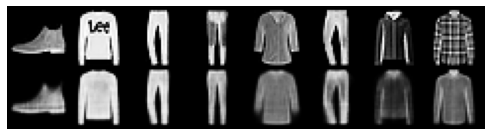

In [25]:
recon_img_list = sorted(glob.glob("reconstruction_*.png"),
                        key=lambda s: int(re.search(r"\d+", s).group()))

fig = plt.figure(figsize=(8, 2), tight_layout=True)
plt.axis("off")
ims = [[plt.imshow(Image.open(img_path), animated=True)] for img_path in recon_img_list]
ani = animation.ArtistAnimation(fig, ims, interval=500, repeat_delay=1000, blit=True)

HTML(ani.to_jshtml())

In [0]:
ani.save("reconstructions.mp4", writer="ffmpeg")

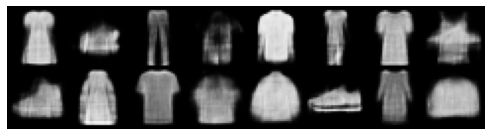

In [27]:
recon_img_list = sorted(glob.glob("sample_*.png"),
                        key=lambda s: int(re.search(r"\d+", s).group()))

fig = plt.figure(figsize=(8, 2), tight_layout=True)
plt.axis("off")
ims = [[plt.imshow(Image.open(img_path), animated=True)] for img_path in recon_img_list]
ani = animation.ArtistAnimation(fig, ims, interval=500, repeat_delay=1000, blit=True)

HTML(ani.to_jshtml())

In [0]:
ani.save("samples.mp4", writer="ffmpeg")